# **Modeling with DSP Algorithms**


The realm of audio-based digital signal processing (DSP) is a diverse field of engineering that contains numerous mathematical approaches for combining and manipulating digital signals in order to synthesize sound. Two such contrasting approaches to synthesizing sound are physical modelling and waveshaping. 

Physical modeling uses algorithms and equations to try to simulate the acoustic properties of physical phenomena, such as a mass-spring dampening system, air passing through tubes, or the vibrations of a plucked string. Waveshaping is a form of additive modulation whereby a source sound (often a simple sinusoid) is passed through a transfer function and scaled in order to create a complex harmonic spectra. With further processing, this approach can be used to simulate certain instruments such as brass or woodwinds, or create complete new and unique sounds.    

This project outlines two specific methods within each of these subfields: the Karplus-Strong algorithm and Chebyshev waveshaping. The mechanisms of each of these two systems are very different, Karplus-Strong is subtractive in nature while Chebyshev waveshaping is additive. However, the underlying goals of both methods are quite similar. Both methods start out with a simple source and through an efficient series of computations, strive to create a uniquely rich sound that can be used in musical applications and acoustic simulations.   

For each method I will outline the theory and equations as well as show analytical solutions computed in Python. As a demonstration of real-world musical applications for these methods, I will also include realizations of each as working synth patches in the dedicated real-time audio language SuperCollider.



## Part 1: Physical Modeling with Karplus-Strong



### Overview and Theory

The Karplus-Strong algorithm was first published in the paper "Digital Synthesis of Plucked Strings and Drum Timbres" by Kevin Karplus and Allen Strong in 1983. As the title suggests, the algorithm is designed to emulate plucked strings and membranes.This is achieved by modeling the characteristic property of a rapid excitation followed by harmonic resonance and rapid decay using a digital filter. 

The KS algorithm was designed for early synthesizers and needed to be very computationally efficient. It can be represented as a simple circuit called a comb filter, essentially a recirculating delay line of a short noise burst that is decayed and filtered over an arbitrary number of samples and summed with the initial noise burst.

There are many variations of the KS algorithm, but the simplest representation is this difference equation:
<br><br>
$$y[n] = x[n] + \alpha(y[n-N] + y[n-(N+1)])$$
<br>
where $N$ is the length of the delay line calculated as $\frac{f_s}{f_0}$, $f_s$ is the sampling frequency, $f_0$ is the fundamental frequency, and $\alpha$ is the averaging coefficient which for stability should be between $0<\alpha <=0.5$. This structure is commonly referred to as a feed-forward comb filter and is often represented by the following block diagram in the DSP literature. The recirculating nature of the filter "combs" out the lower parts of the harmonic spectra as the buffer circulates.
<br>

<img src="karplus_block_diagram.png">

Here $Z^{-N}$ is the delay line of $N$ samples, the initial noise burst that recirculates and is continually averaged through a low pass filter summed with the initial noise burst itself. The computational efficiency lies in the fact that the initial pitch is generated not through a multiplication of sinusoidal signals, but rather the ratio of sampling rate over the length of the noise burst, $f_0 = \frac{f_s}{N}$






### Computation and Analysis in Python






In [22]:
## import neccessary libraries for analysis
import numpy as np
import librosa
from scipy import signal
import matplotlib.pyplot as plt
%matplotlib inline
import seaborn
seaborn.set(style='ticks')
import IPython.display as ipd  # for integrated audio output
from collections import deque  # for karplus version 1 example

The simplest approach to realizing the Karplus Strong algorithm involves first calculating the length of the output vector $n$, which will be the sample rate multiplied by the duration in seconds. Next the length of the noise burst $N$ is calculated as the integer result of the sampling rate over the desired frequency as described in the equation above. 

The code snippets below will create a sound at the sampling rate of 44100 and a duration of 1 second


In [23]:
sr = 44100        #sampling rate
dur = 1           #duration in seconds
n = sr * dur

freq = 440       # desired freq in Hz
N = int(sr/freq)  # length of noise burst

Next, we create the noise burst vector $x$ of length $N$ using a uniform distribution (white noise). For a 1 second output tone at 440Hz, the vector will be $\frac{44100}{440} \approx 100$ samples.

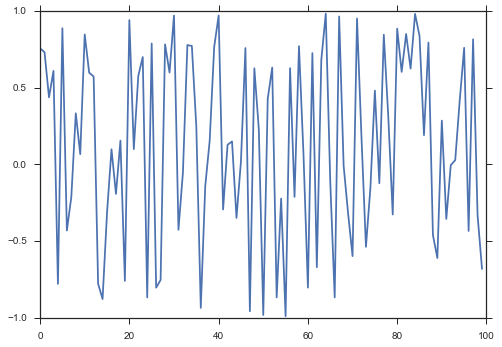

In [24]:
x = np.random.uniform(-1.0,1.0,N)
plt.plot(x)  # plot of the noise burst vector

Now that the initial excitation is created, we need a space for the rest of the sound to form for the desired duration. We therefore initialize a vector of zeros of length $n-N$ and attach this to the 100 sample $x$ vector. We call this the output vector $y$, and it is equivalent to the sample rate times the duration. For our 1 second sound at 44100, the zero vector is length 44000 and resulting $y$ vector 44100. This takes care of the $x[n]$ summation part of the circuit diagram. 

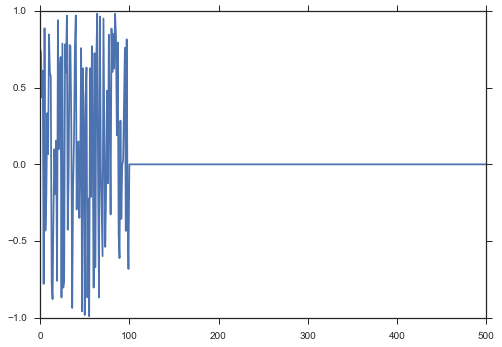

In [25]:
zeros = np.zeros(n - N)        # create the difference in zeros
y = np.append(x, zeros)        # append to x

plt.plot(y[0:500])  # shows the first 500 samples of the output buffer y.


Now that the output $y$ vector is set, we iterate over $y$ and replace the zeros starting at length $n-N$ with result of the averaging low-pass filter part of the difference equation. For our 1 second sound at 44100sr, the 100 sample noise burst is averaged by the low-pass filter 441 times, which eliminates a little bit more of the low end of the 100 samples each pass. This process is what simulates the sound of a real-life plucked string; an initial noise burst from the pluck with a gradual decay of the low frequencies.

Each value is also scaled by what is referred to as a decay factor. This is not included in the original equation, but is essentially an extension to the algorithm that pushes the overall amplitude of the signal down as the initial noise burst is filtered. This is for aesthetic purposes to create a more realistic sounding result and is often set between 0.99 and 0.999 with varying levels controlling the dampening of the pluck. For an extremely dampened sound, levels below 0.99 can be used.

This new equation reads:
$$y[n] = x[n] + D_0\alpha(y[n-N] + y[n-(N+1)])$$


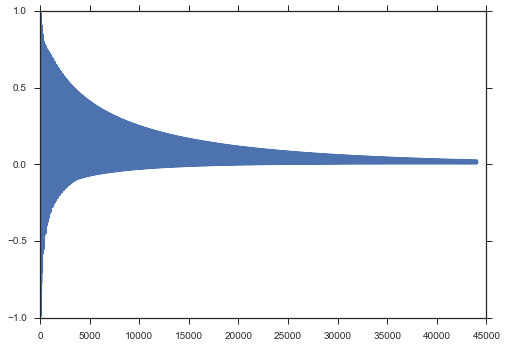

In [26]:
decay_factor = 0.995
alpha = 0.5

for i in range(n - N):
        y[i + len(x)] = decay_factor * alpha * (y[i] + y[i+1])  # circulate noise burst and calculate LPF
                                                                # for remaining length of vector y
plt.plot(y)  # plot of result
ipd.Audio(y,rate=sr)

Below the algorithm is encapsulated in a function and some examples are generated with different setttings for frequency, dur and decay_factor. Note that higher frequencies with low resonance have a less discernable pitch.

In [27]:
def karplus(freq, dur, decay_factor, sr):

    n = int(sr * dur)           # length of output signal in samples per second
    N = int(sr/freq)    # length of delay line
    
    x = np.random.uniform(-1.0,1.0,N)        # create Noise burst (delay-line) 
    zeros = np.zeros(n - N)        # create the difference in zeros
    y = np.append(x, zeros)        # add x to y (this satisfies the summation in the difference equation)
    
    buf_len = np.arange(n)/float(sr)
    
    for i in range(n - N):
        y[i + len(x)] = decay_factor * 0.5 * (y[i] + y[i+1])  # computes new values for the rest of the y buffer by averaging

    return buf_len, y

In [28]:
x, output1 = karplus(130,3,.998,44100)   # low freq high resonance
ipd.Audio(data=output1,rate=44100)

In [29]:
x, output2 = karplus(1660,0.5,.993,44100)  # high freq no resonance
ipd.Audio(data=output2,rate=44100)

### DSP Implementation of KS Algorithm in SuperCollider

Real world audio applications do not neccesarily rely on pre-recorded vectors and iterative methods in order to synthesize these kind of sounds. Synths made in languages such as SuperCollider often need to compute values for signals in real time at audio rate. Computational efficiency is of the utmost importance, and these languages will often have sets of optimized filters that will perform the above process in real-time on an input stream.

The patch below takes a midi pitch value and decay time in seconds. The length of noise burst needs to be in seconds, so the reciprocal of the frequency of the midi pitch is calculated. This delay time is fed into a comb filter along with the signal and decay time. It is also used as the length of the decay value in the noise_burst envelope.

The Routine is the control function that plays the SynthDef patch.


In [30]:
ipd.Audio('pluck_example.wav', rate=441000)

## Part 2: Waveshaping Synthesis with Chebyshev Polynomials

### Overview and Theory

Waveshaping is a synthesis technique that creates a complex spectra by passing a simple sinusoidal signal at a fundamental frequency through a polynomial transfer function. It is similar in some ways to different forms of additive and modulation synthesis, where a complex spectra is generated from a simple sinusoid. It differs however in terms of its computational effiency and its ability to accurately reproduce harmonic spectra when a summed series of Chebyshev Polynomials are used as a transfer function.

In practice, the distorted timbre produced can be used to simulate certain brass-like tones, such as trombone and trumpet.  


A Chebyshev waveshaping transfer function can be defined:
$$F(x) = d_0T_0(x) + d_1T1(x) + d_2T2(x) ... d_kT_k(x)$$

where $T_k$ is the $k$th Chebyshev function and d is a scaling value (usually between 0 and 1).

The Chebyshev polynomials are constructed using the formula $T_{k+1}(x) = 2xT_kx - T_{k-1}x$. 

The first 8 Chebyshev polynomials are:
$$T_0 = 1 \\T_1=x \\ T_2 = 2x^2 -1\\T_3 = 4x^3 - 3x\\T_4=8x^4 - 8x^2+1\\T_5 =16x^5 -20x^3+5x\\T_6=32_x^6-48x^4+18x^2 -1 \\ T_7 = 64x^7-112x^5+56x^3-7x\\T_8=128x^8-256x^6+160x^4-32x^2+1$$




The underlying property of the Chebyshev polynomial functions is $T_k * cos(f_0) = cos(k * f_0)$. By applying the $k$th Chebyshev Polynomial to input sine wave results in a cosine wave at the $k$th harmonic of the fundamental frequency of the input.[Roads, p.256] In this way, each term of the polynomial is related to a particular harmonic of the input $x$. Each of these terms can then be scaled (usually between 0 and 1) to produce a unique harmonic spectra. 

The computational effiency lies in the fact that a transfer function of an arbitrarily large number of terms and scalar values can be computed in advance and stored in a table. For real-time synthesis where sinusoidal inputs are often computed and modulated as an input stream, this can save a great deal of processing time. A mathematical computation of a single polynomial equation is much faster than simultaneously computing several dozen oscillators in real time.

Using Chebyshev polynomials has an advantage over frequency/amplitude modulation in that since one has control of the $N$th harmonic of an output signal, the function can be guaranteed to produce a band-limited output signal given a sinusoidal signal of amplitude 1. 


### Computation and Analysis in Python

In order to build the waveshaping function, we first build out a set of Chebyshev transfer functions. Here we use the set from $T_0$ to $T_8$. This means our waveshaper can produce spectra up to the 8th harmonic of the input sinusoid frequency.

The plot below shows the cosine outputs of first 6 Chebyshev polynomials. T0 is often left out and T1 is linear, simply reproducing the input signal.

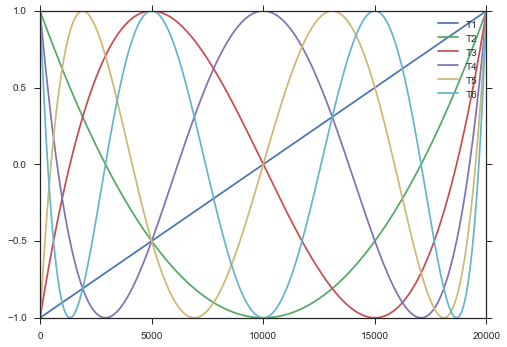

In [31]:
## define Chebyshev's up to from T1 to T8
T0 = lambda x: 1
T1 = lambda x: x
T2 = lambda x: 2*x**2 - 1
T3 = lambda x: 4*x**3 - 3*x
T4 = lambda x: 8*x**4 - 8*x**2 + 1
T5 = lambda x: 16*x**5 - 20*x**3 + 5*x
T6 = lambda x: 32*x**6 - 48*x**4 + 18*x**2 - 1
T7 = lambda x: 64*x**7 - 112*x**5 + 56*x**3 - 7*x
T8 = lambda x: 128*x**8 - 256*x**6 +160*x**4 - 32*x**2 + 1

## a plot of the first 6 Cheby Polys
plt.plot(T1(np.arange(-1,1,0.0001)),label='T1')
plt.plot(T2(np.arange(-1,1,0.0001)),label='T2')
plt.plot(T3(np.arange(-1,1,0.0001)),label='T3')
plt.plot(T4(np.arange(-1,1,0.0001)),label='T4')
plt.plot(T5(np.arange(-1,1,0.0001)),label='T5')
plt.plot(T6(np.arange(-1,1,0.0001)),label='T6')

plt.legend()


The following function produces a single sine wave of specified frequency, amplitude and duration at sample rate 44100. We make and plot a 10Hz sine wave. We also plot the power density spectrum using signal.periodogram() to see the magnitude of the sinusoid.

In [32]:
def make_sine(freq, dur, amp):
    sr = 44100
    nsamp = sr * dur
    x = np.arange(nsamp)/float(sr)
    y = amp * np.sin(2.0 * np.pi * freq * x)
    
    return x, y

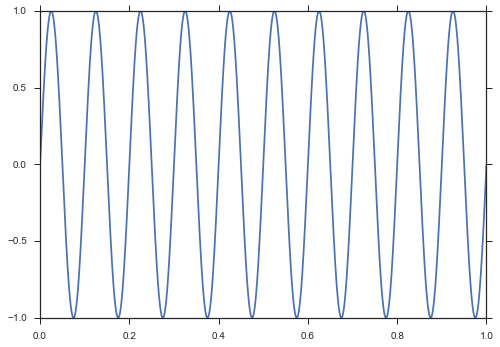

In [33]:
x, y_sine = make_sine(10,1,1)
plt.plot(x,y_sine)  # make and plot a 10Hz sine wave


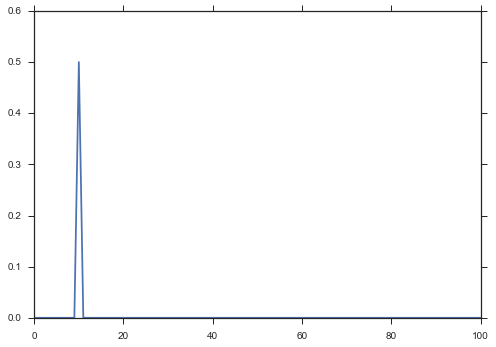

In [34]:
f, Pxx_den = signal.periodogram(y_sine, 44100,scaling='spectrum') # plot spectrum density
plt.xlim(0,100)  # frequency access
plt.plot(f,Pxx_den)


Now we build the waveshaping function using the above $T_k$ Chebyshev Polynomials. An array of arbitray scalar values for each of the 8 harmonics is passed in along with a vector of the 10Hz sinusoid. 

One of the drawbacks of waveshaping is that it can be difficult to control the amplitude of the waveshaped output. There are several techniques that are easier to implement in a dedicated DSP language such as adding a high pass filter at 1Hz to center the frequency and passing the signal through a peak normalization table. For simplicity, we will just scale the entire output vector by an arbirary value to get it within a normalized range of -1,1. 

In [35]:
def cheby_shaper(x, d):
    return d[0]*T1(x) + d[1]*T2(x) + d[2]*T3(x) + d[3]*T4(x) + d[4]*T5(x) + d[5]*T6(x) + d[6]*T7(x) + d[7]*T8(x)


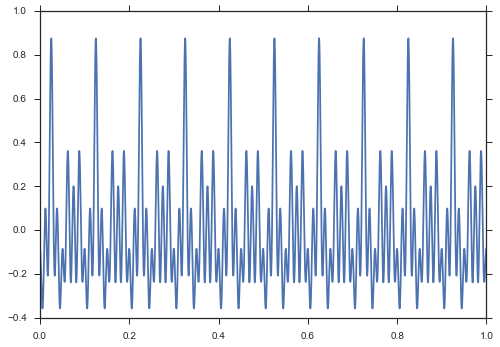

In [36]:
shaped = cheby_shaper(y_sine, [0.2,0.75,0.7,0,0.35,0.5,0.1,0.9])
shaped = shaped * 0.25

plt.plot(x,shaped) 


The power spectrum shows the relative magnatudes of each of the harmonics based on the scaling array $d$. Since the fundamental of the input sinusoid $f_0=10$, harmonics are at $2 * 10 = 20$, $3 * 10 = 30$, $4 * 10 = 40$, etc.

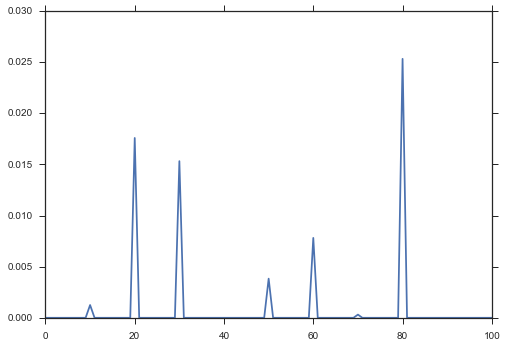

In [37]:
f, Pxx_den = signal.periodogram(shaped, 44100)
plt.xlim(0,100)
plt.plot(f,Pxx_den)

Since we are able to predict the harmonic output based on the amplitude of each Chebyshev function $T_k$, we can recreate the harmonic spectra if we know the fundamental frequency and amplitude of each component. 

The additive_sine() function below sums 3 sinusoids to create a signal with spectral components at the 3rd and 5th harmonics. 

In [38]:
def additive_sine(f0,f1,f2, dur, amp1,amp2,amp3):
    
    sr = 44100
    nsamp = sr * dur
    x = np.arange(nsamp)/float(sr)
    y1 = amp1 * np.sin(2.0 * np.pi * f0 * x)
    y2 = amp2 * np.sin(2.0 * np.pi * f1 * x)
    y3 = amp3 * np.sin(2.0 * np.pi * f2 * x)
    
    return x, y1 + y2 + y3

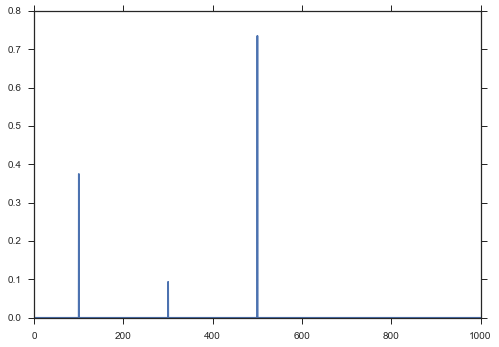

In [39]:
x, ad_sine = additive_sine(100,300,500,3,0.5,0.25,0.7)
f, Pxx_den = signal.periodogram(ad_sine, 44100)
plt.xlim(0,1000)
plt.plot(f,Pxx_den)

ipd.Audio(ad_sine,rate=44100)

Now a wave-shaped version is created using the shaper() function and a single 3 second sinusoid at 100Hz and amplitude 1. The $d$ scalar values for the 1st, 3rd and 5th harmonic match the the amplitudes in the ad_sine singal. Note that the power spectrum output matches the additive signal exactly.

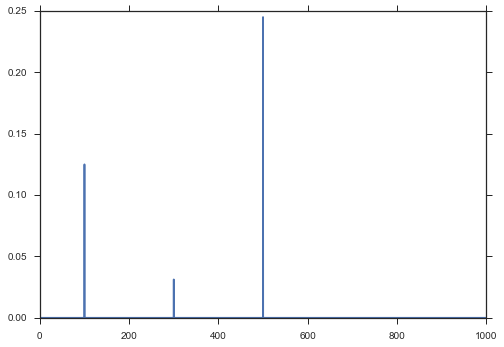

In [40]:
x, y_sine2 = make_sine(100,3,1)  # sine - f0 = 100, duration 3 seconds, amp 1

shape_sine2 = cheby_shaper(y_sine2, [0.5,0,0.25,0,0.7,0,0,0]) # wave_shaped output

f, Pxx_den = signal.periodogram(shape_sine2, 44100, scaling='spectrum')
plt.xlim(0,1000)
plt.plot(f,Pxx_den)

ipd.Audio(shape_sine2, rate=44100)

### DSP Implementation of Chebyshev Waveshaping in SuperCollider


For real-time audio synthesis, the Chebyshev transfer functions are computed in advance. SuperCollider has a convience method for buffer objects, .chebyMsg(), which calculates the selected $T_k$ polynomial functions. 

The Synth contains a simple SinOsc object that calculates a sine wave and scales the amplitude. This is then fed along with a duration envelope and buffer object into the Shaper object which performs calculates the transfer function at each pitch.

The Routine object creates an ambient texture of brass and woodwind type sounds by generating random values for each note event. The different buffers, amplitudes and fundamental frequencies create unique sounds for each note. The Reverb synth is used to warm up the sounds for aesthetic purposes.

In [41]:
ipd.Audio('cheby_example.wav', rate=441000)

### References / Resources 

Roads, Curtis. _The Computer Music Tutorial_. MIT Press, Cambridge, 1996.

Farnell, Andy. _Designing Sound_. MIT Press, London, 2010.

Karplus, Kevin; Strong, Allen. "Digital Synthesis of Plucked String and Drum Timbres."_Computer Music Journal, Vol. 7, number 2_, 1983. pp. 43-55.

